In [1]:
# Add imports here
from tgmage import *

# Edit the font, font size, and axes width
plt.rcParams['font.size'] = 10
plt.rcParams['axes.linewidth'] = 1

Parameters of analysis

In [2]:
# Paremeters
MY_ILs = ['Bmim_NTf2', 'Bmim_TFO', 'Emim_NTf2', 'Emim_Cl', 'Emim_PF6', 'Emim_BF4']
K_ILs = ['K_Bmim_NTf2', 'K_Bmim_TFO', 'Bmim_OTS', 'Bpyri_NTf2', 'bmPyrr_NTf2', 'K_Emim_NTf2', 'K_Emim_PF6', 'K_Emim_BF4', 'Emim_Br', 'Emim_MESO4']
Tg = {}
methods = ["density"]
warmups = [30]


Line Test, warmup: 30.0

Glass Diagnostics
Temperature: [150.  187.5 225.  262.5 300. ]
Glass p-values: [[225.    1. ]
 [262.5   1. ]
 [300.    1. ]]
Glass warmup ends:  225.0
Glass phase fitting range [150.0, 225.0]
Glass phase Fitting points:  [[150.      3.   ]
 [187.5     2.625]
 [225.      2.25 ]]

Liquid Diagnostics
Temperature: [150.  187.5 225.  262.5 300. ]
Liquid p-values: [[150.    1. ]
 [187.5   1. ]
 [225.    1. ]]
Liquid warmup ends:  225.0
Liquid phase fitting range: [300.0, 225.0]
Liquid phase fitting points: [[225.      2.25 ]
 [262.5     1.875]
 [300.      1.5  ]]

Tg:  nan


/afs/crc.nd.edu/user/f/fcarmona/.local/lib/python3.9/site-packages/scipy/stats/_morestats.py:1758: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
/scratch365/fcarmona/LANL_Tg_Study/Tg_methods/TgMage/tgmage/TgMage/TgMage/tgmage.py:198: RuntimeWarning: invalid value encountered in scalar divide
  Tg = (L_b - G_b)/(G_m - L_m)
/afs/crc.nd.edu/user/f/fcarmona/.conda/envs/TgMage/lib/python3.9/site-packages/matplotlib/axes/_base.py:2532: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)
/scratch365/fcarmona/LANL_Tg_Study/Tg_methods/TgMage/tgmage/TgMage/TgMage/tgmage.py:231: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  axs[1, 0].set_ylim((Residuals.min(), Residuals.max()))


nan


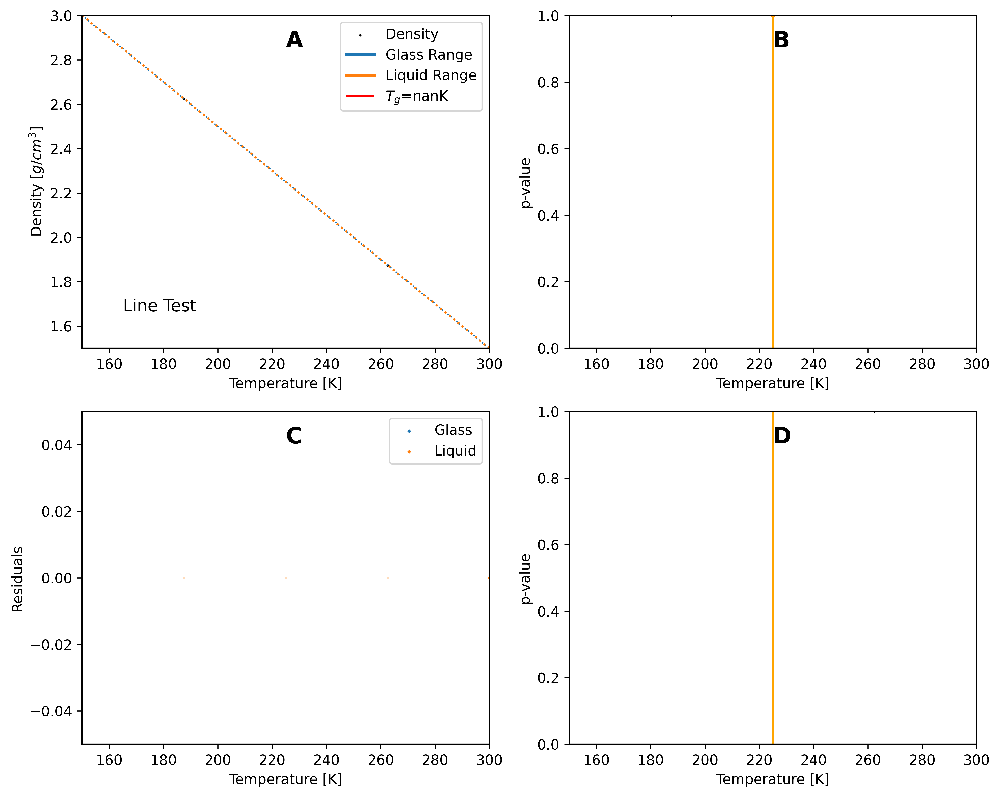

In [3]:
# Line Example
syn_density = np.linspace(3.00, 1.50, 5)
syn_temp = np.linspace(150, 300, 5)
data = np.array([syn_temp, syn_density])
print(Tg_finder(data, label="Line Test", verbose=2, save='.'))

Analysis of My simulated systems


Bmim_NTf2, warmup: 30


/afs/crc.nd.edu/user/f/fcarmona/.local/lib/python3.9/site-packages/scipy/stats/_morestats.py:1761: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



Tg:  206.76947154116297

Bmim_TFO, warmup: 30

Tg:  220.2185403807775

Emim_NTf2, warmup: 30

Tg:  211.07268238178187

Emim_Cl, warmup: 30

Tg:  225.92844142736078

Emim_PF6, warmup: 30

Tg:  215.45061882159857

Emim_BF4, warmup: 30

Tg:  224.23913721389133


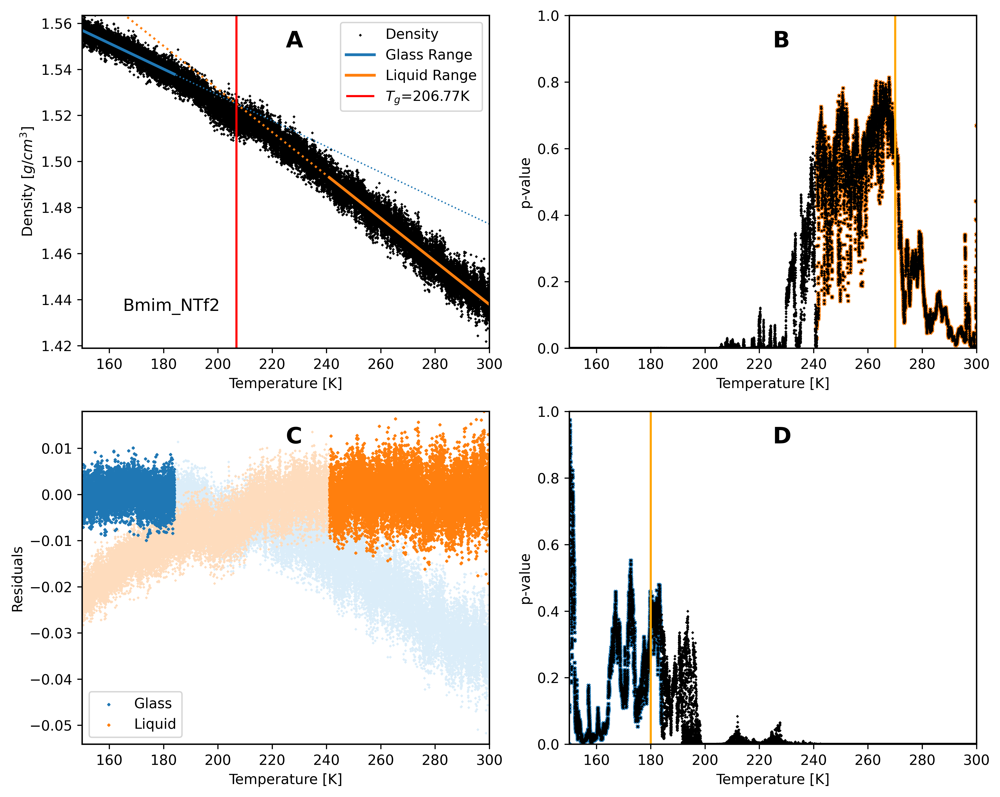

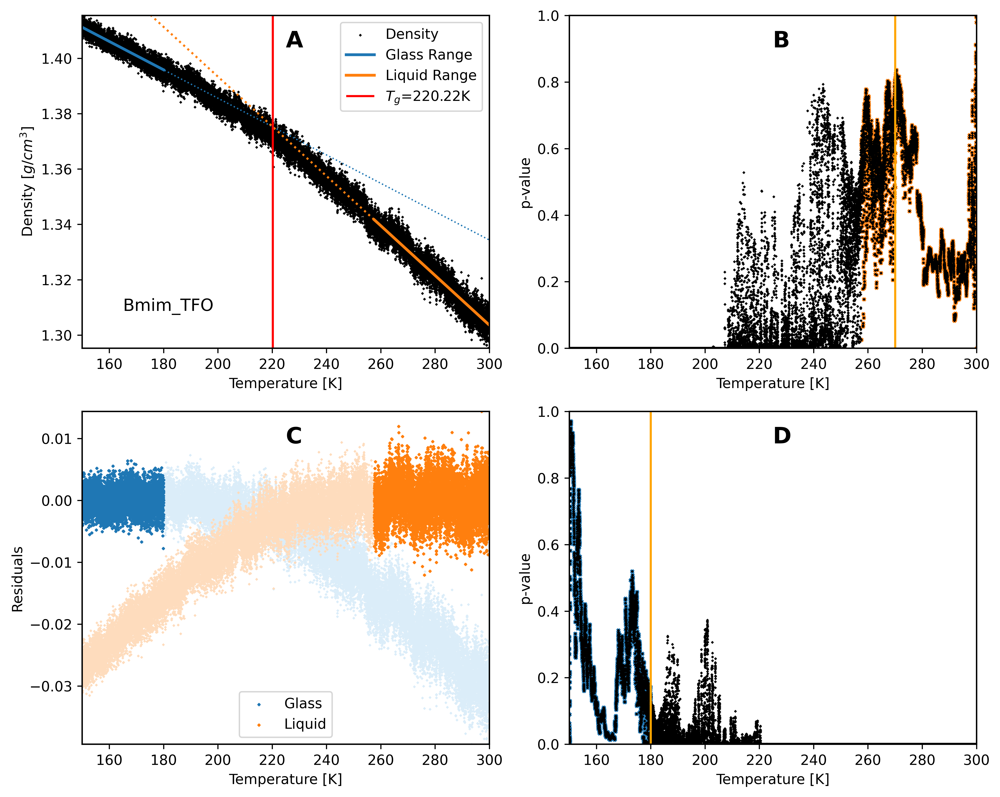

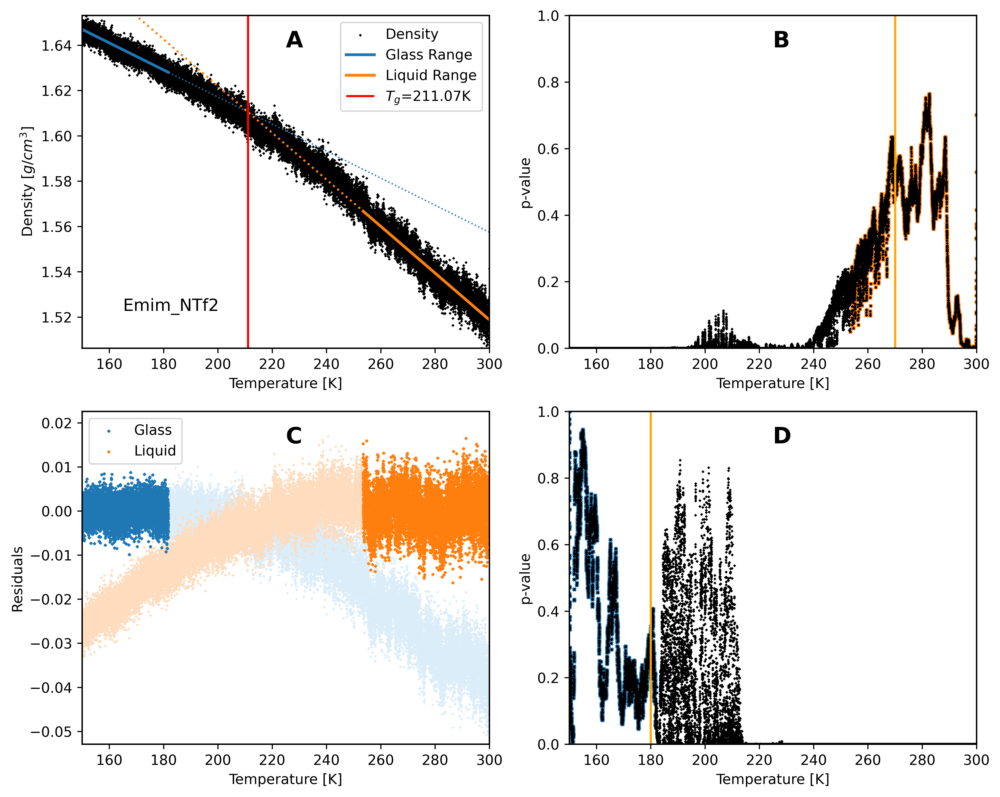

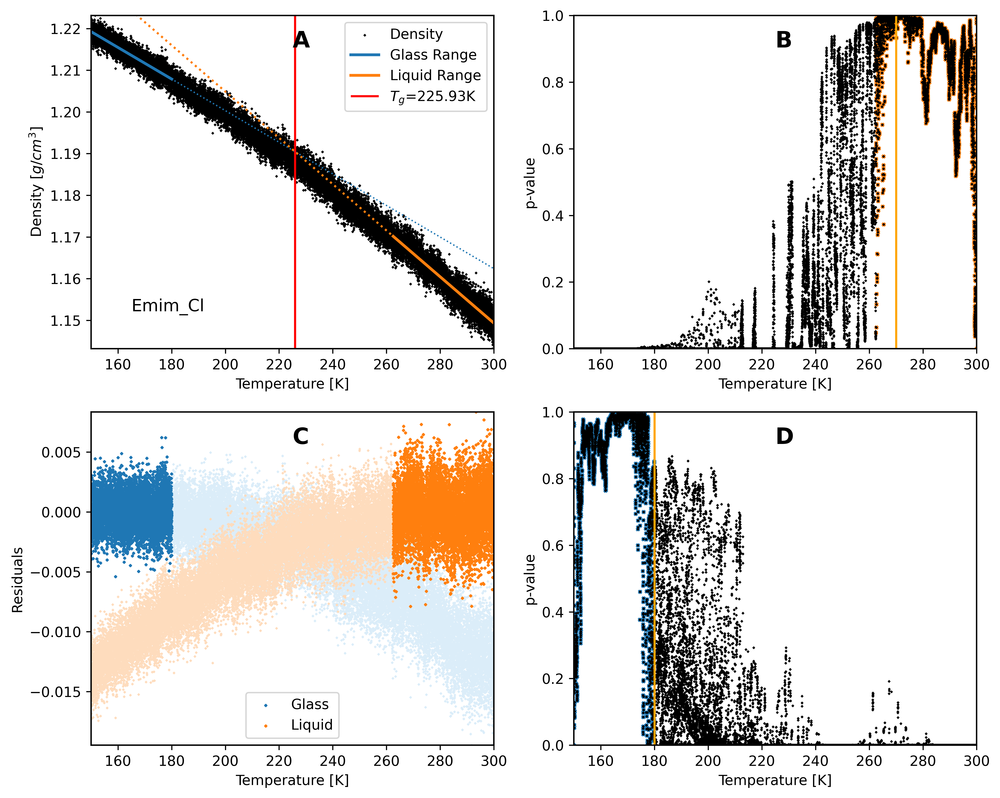

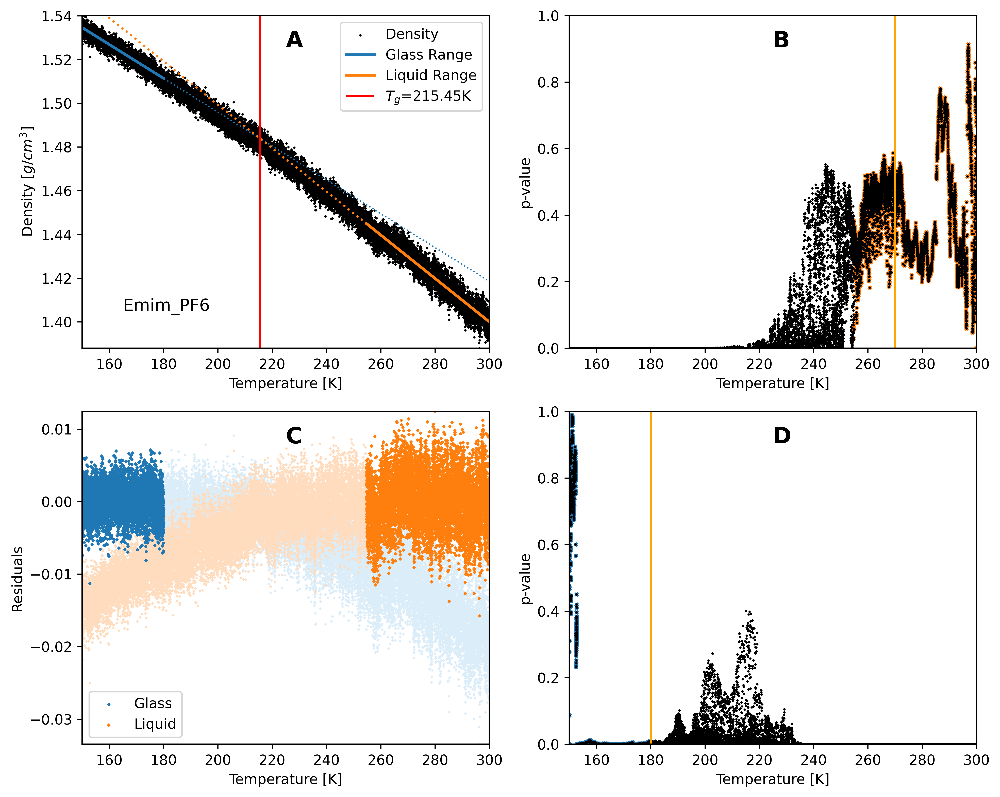

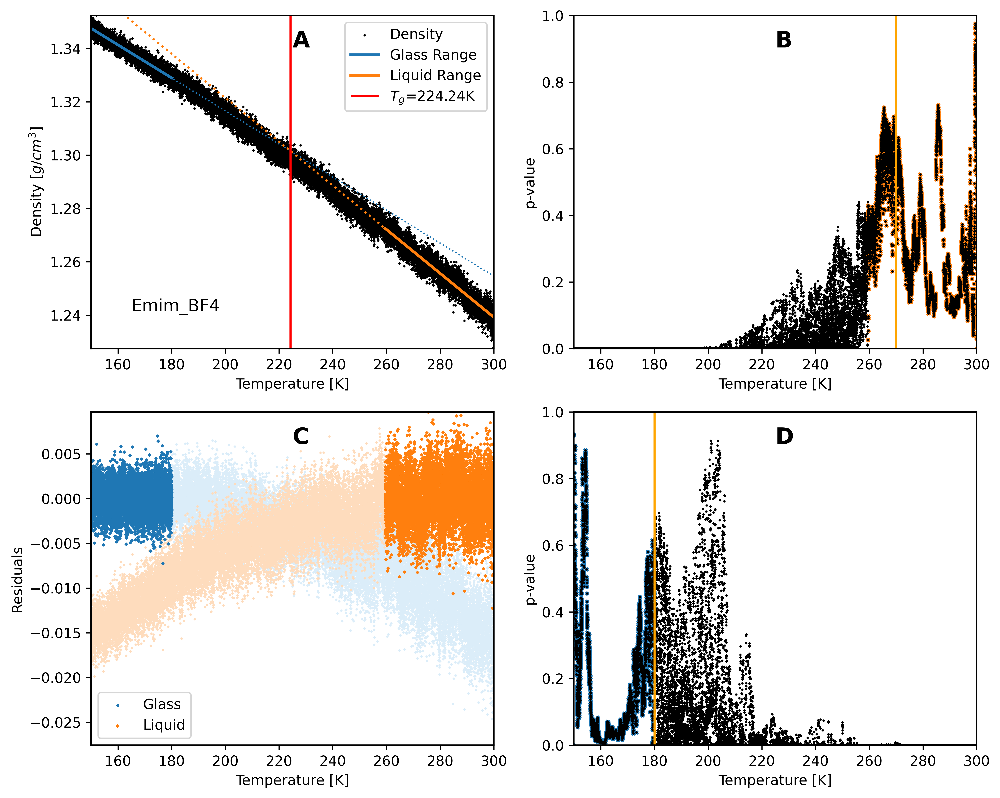

In [4]:
# Load and compute Tg
for il, IL in enumerate(MY_ILs):
    Tg[IL] = {}
    path = f"../../../../../ILs/{IL}/0.0000_V-A/Ramping/replicate_1"
    # print(path)

    # Load Data 
    density, header_list = thermo_extractor(f"{path}/5K-ns_thermo.txt", wanted_property="Density")
    
    # Temperature Ramp
    T_start = 300
    T_low = 150
    thermostat = np.linspace(T_start, T_low, num=len(density[1]))

    # Construct Density temperature data 
    density[0] = thermostat  
    
    # Flip 
    density = np.flip(density, axis=1)
        
    # Compute Tg with new method V2 
    for warmup in warmups:
        Tg[IL][warmup] = Tg_finder(density, IL, verbose=1, warmup=warmup, save=".")
        
    # Save everytime
    f = open("Tg.pkl","wb")          
    pickle.dump(Tg,f) # write the python object (dict) to pickle file
    f.close() # close file

In [5]:
Tg

{'Bmim_NTf2': {30: 206.76947154116297},
 'Bmim_TFO': {30: 220.2185403807775},
 'Emim_NTf2': {30: 211.07268238178187},
 'Emim_Cl': {30: 225.92844142736078},
 'Emim_PF6': {30: 215.45061882159857},
 'Emim_BF4': {30: 224.23913721389133}}